## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "singer_age_decade_20"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "singer_age_decade"
target_positive_class = 20


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 100


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


Matplotlib is building the font cache; this may take a moment.


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6503
Epoch 11 Validation Loss: 0.6874
Epoch 21/500
Epoch 21 Train Loss: 0.6098
Epoch 21 Validation Loss: 0.6869
Early stopping at epoch 21
Loss history saved to trainings/singer_age_decade_20/loss_history.json


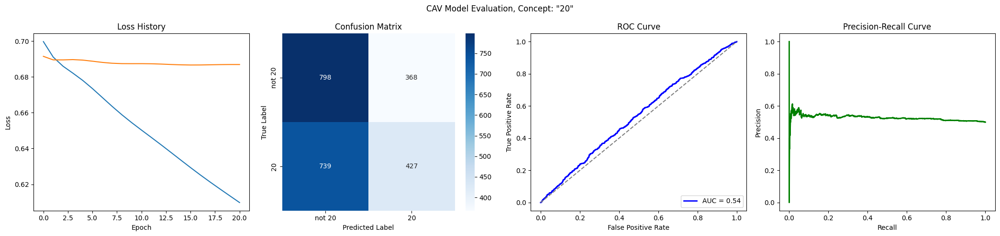

Training run 2/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7002
Epoch 1 Validation Loss: 0.7001
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6602
Epoch 11 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6252
Epoch 21 Validation Loss: 0.6865
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5933
Epoch 31 Validation Loss: 0.6835
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5638
Epoch 41 Validation Loss: 0.6823
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_20/loss_history.json


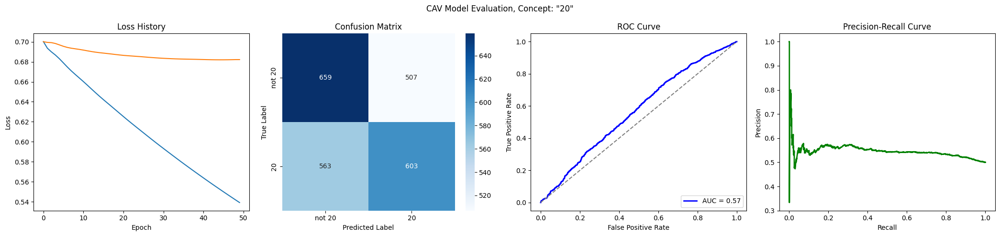

Training run 3/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6511
Epoch 11 Validation Loss: 0.6879
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6135
Epoch 21 Validation Loss: 0.6847
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5856
Epoch 31 Validation Loss: 0.6844
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_20/loss_history.json


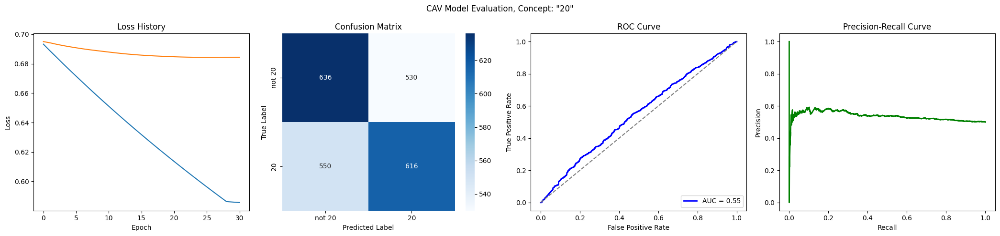

Training run 4/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6964
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6472
Epoch 11 Validation Loss: 0.6850
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6071
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5720
Epoch 31 Validation Loss: 0.6798
Early stopping at epoch 32
Loss history saved to trainings/singer_age_decade_20/loss_history.json


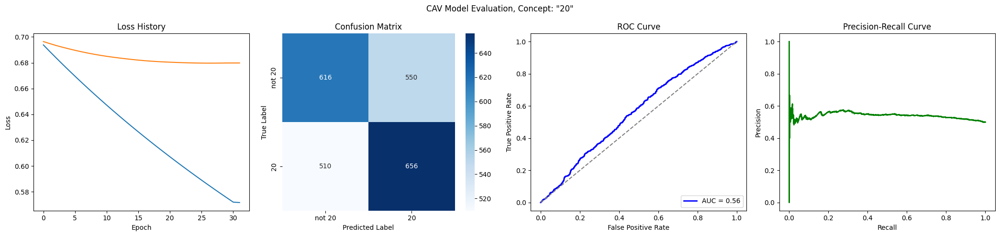

Training run 5/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


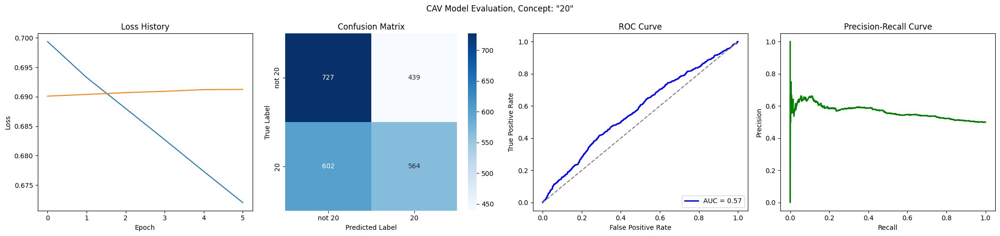

Training run 6/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_20/loss_history.json


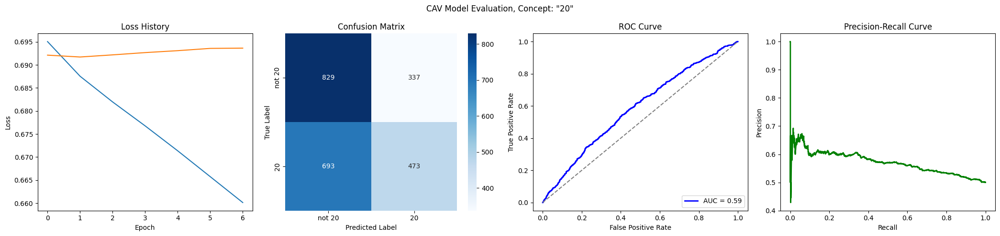

Training run 7/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6507
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6133
Epoch 21 Validation Loss: 0.6735
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5815
Epoch 31 Validation Loss: 0.6678
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5536
Epoch 41 Validation Loss: 0.6632
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5284
Epoch 51 Validation Loss: 0.6593
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5053
Epoch 61 Validation Loss: 0.6563
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

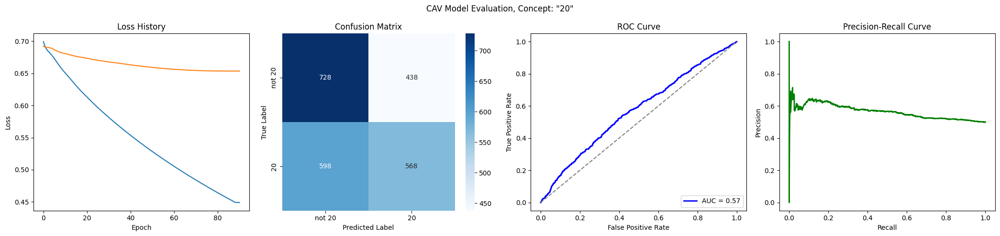

Training run 8/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6567
Epoch 11 Validation Loss: 0.6843
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6263
Epoch 21 Validation Loss: 0.6813
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5985
Epoch 31 Validation Loss: 0.6795
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5754
Epoch 41 Validation Loss: 0.6795
Early stopping at epoch 41
Loss history saved to trainings/singer_age_decade_20/loss_history.json


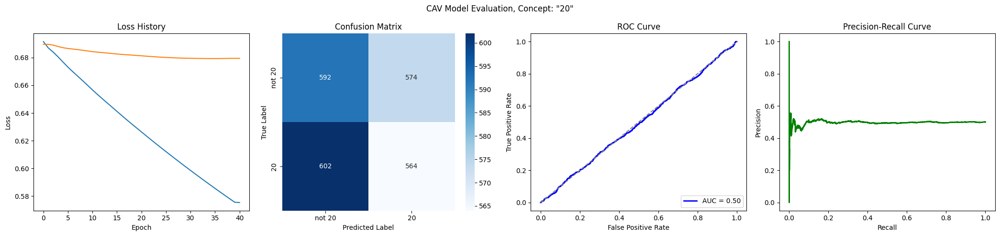

Training run 9/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6519
Epoch 11 Validation Loss: 0.6861
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6147
Epoch 21 Validation Loss: 0.6799
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5829
Epoch 31 Validation Loss: 0.6760
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5545
Epoch 41 Validation Loss: 0.6741
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5285
Epoch 51 Validation Loss: 0.6735
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/singer_age_decade_20/loss_history.json


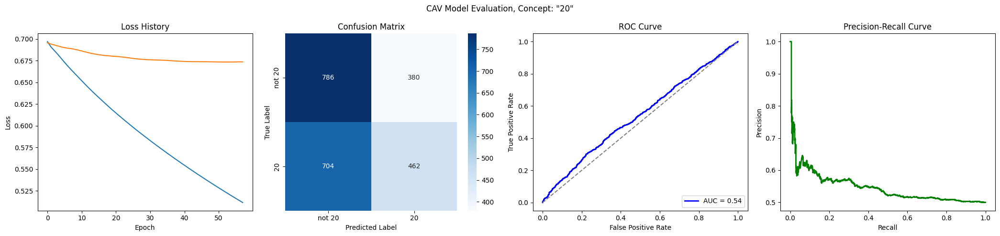

Training run 10/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


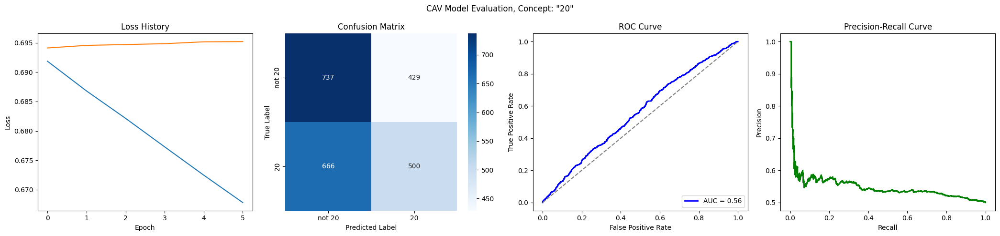

Training run 11/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6963
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6566
Epoch 11 Validation Loss: 0.6954
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_20/loss_history.json


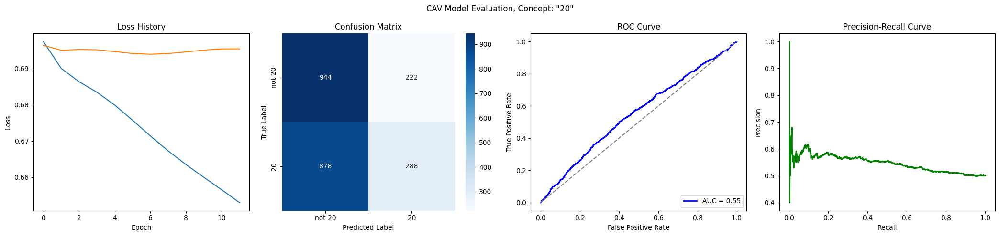

Training run 12/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6958
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6489
Epoch 11 Validation Loss: 0.6942
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_20/loss_history.json


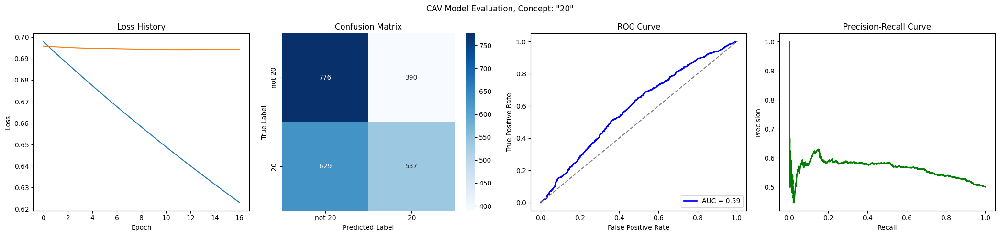

Training run 13/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 8
Loss history saved to trainings/singer_age_decade_20/loss_history.json


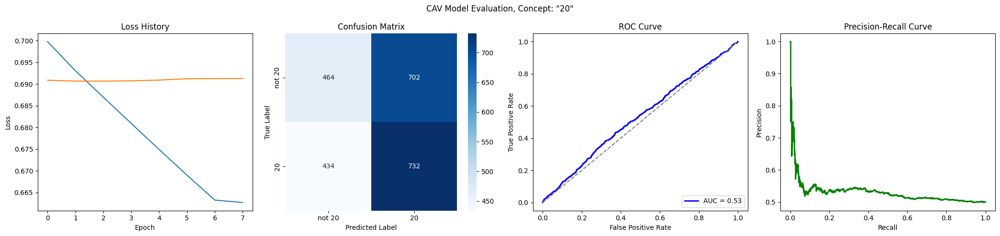

Training run 14/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7039
Epoch 1 Validation Loss: 0.6971
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_20/loss_history.json


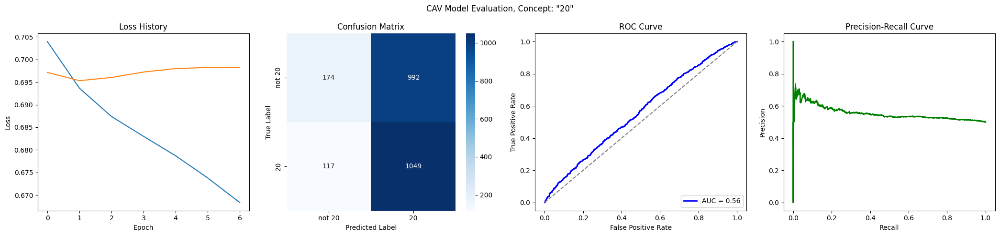

Training run 15/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6962
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


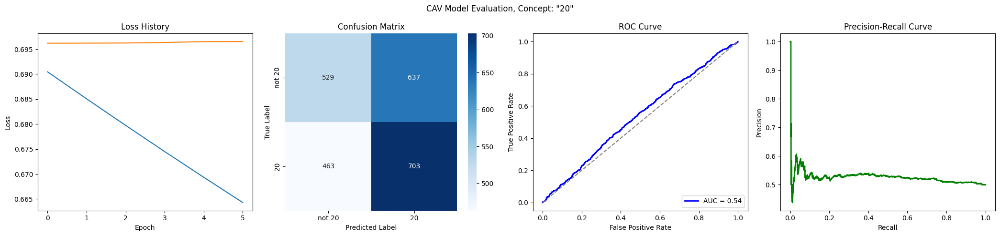

Training run 16/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7062
Epoch 1 Validation Loss: 0.6986
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_20/loss_history.json


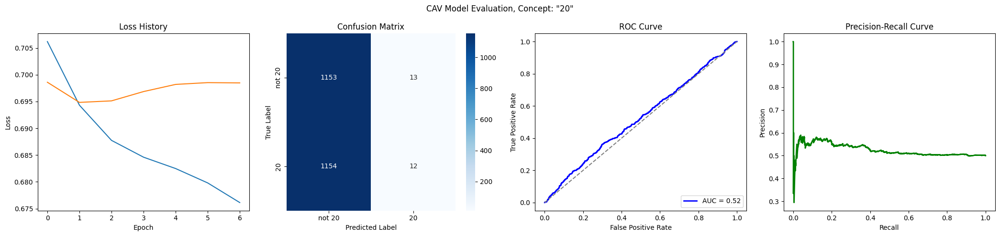

Training run 17/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6483
Epoch 11 Validation Loss: 0.6828
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6084
Epoch 21 Validation Loss: 0.6785
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_20/loss_history.json


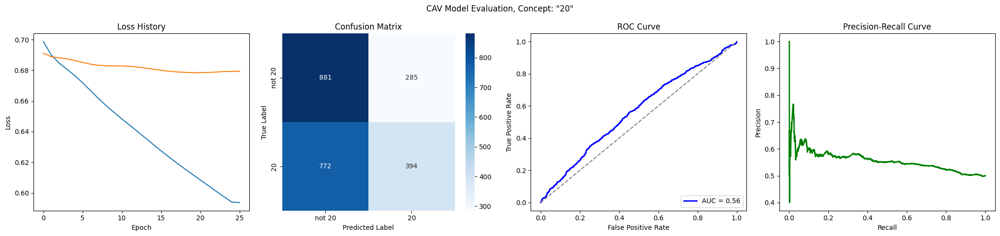

Training run 18/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6522
Epoch 11 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6129
Epoch 21 Validation Loss: 0.6863
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5781
Epoch 31 Validation Loss: 0.6854
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 37
Loss history saved to trainings/singer_age_decade_20/loss_history.json


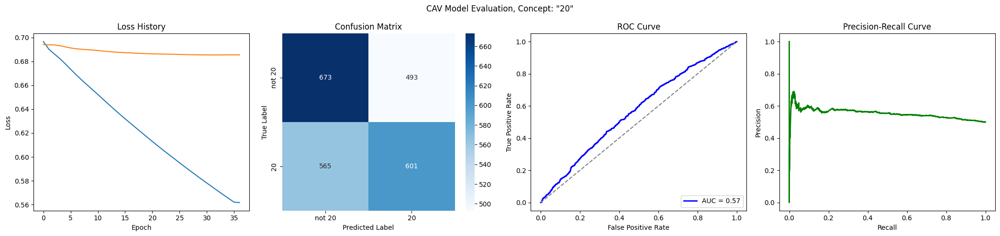

Training run 19/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6980
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


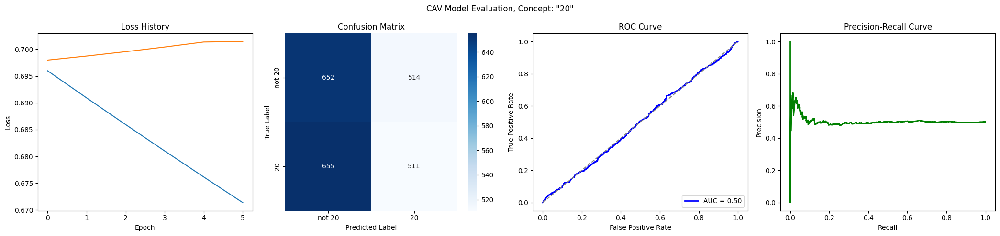

Training run 20/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6440
Epoch 11 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6092
Epoch 21 Validation Loss: 0.6891
Early stopping at epoch 21
Loss history saved to trainings/singer_age_decade_20/loss_history.json


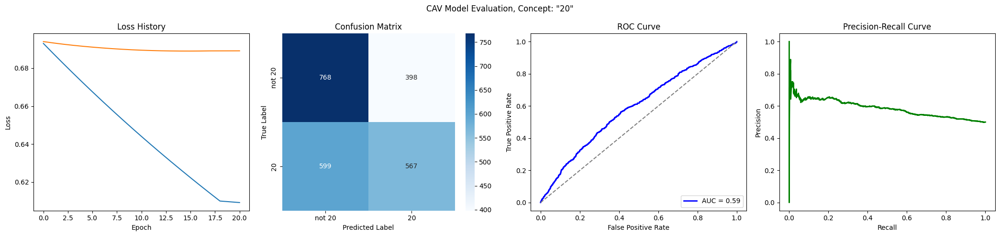

Training run 21/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


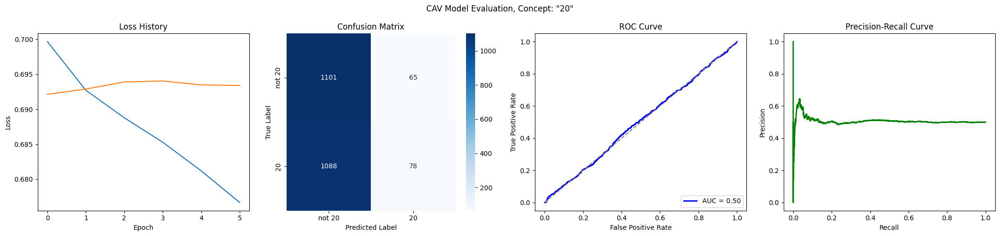

Training run 22/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6385
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5917
Epoch 21 Validation Loss: 0.6847
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_20/loss_history.json


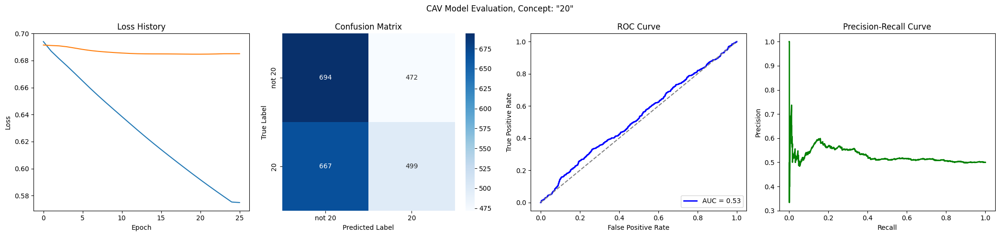

Training run 23/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


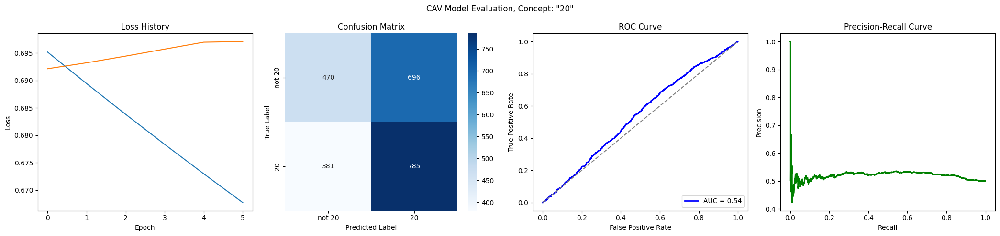

Training run 24/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6407
Epoch 11 Validation Loss: 0.6883
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 16
Loss history saved to trainings/singer_age_decade_20/loss_history.json


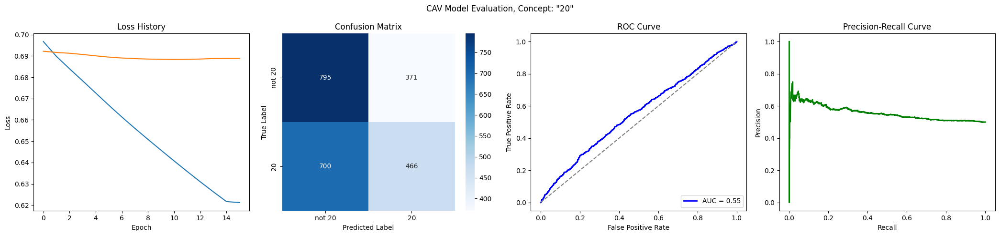

Training run 25/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6694
Epoch 11 Validation Loss: 0.6887
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6650
Epoch 21 Validation Loss: 0.6876
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6610
Epoch 31 Validation Loss: 0.6873
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6588
Epoch 41 Validation Loss: 0.6872
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 48
Loss history saved to trainings/singer_age_decade_20/loss_history.json


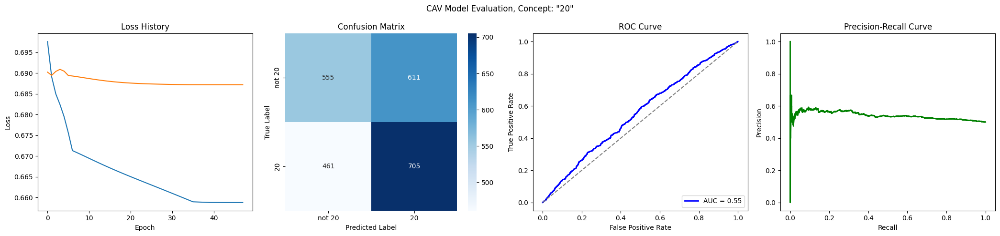

Training run 26/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6973
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6495
Epoch 11 Validation Loss: 0.6845
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6099
Epoch 21 Validation Loss: 0.6756
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5746
Epoch 31 Validation Loss: 0.6703
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5432
Epoch 41 Validation Loss: 0.6672
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5150
Epoch 51 Validation Loss: 0.6666
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 56
Loss history saved to trainings/singer_age_decade_20/loss_history.json


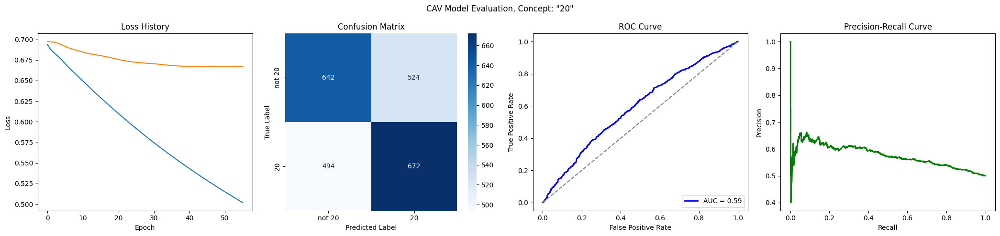

Training run 27/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6562
Epoch 11 Validation Loss: 0.6835
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6196
Epoch 21 Validation Loss: 0.6758
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5864
Epoch 31 Validation Loss: 0.6710
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5564
Epoch 41 Validation Loss: 0.6685
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5291
Epoch 51 Validation Loss: 0.6676
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/singer_age_decade_20/loss_history.json


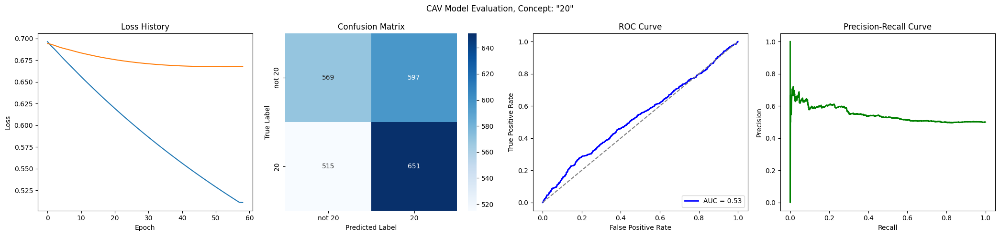

Training run 28/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7013
Epoch 1 Validation Loss: 0.6974
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6416
Epoch 11 Validation Loss: 0.6864
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5940
Epoch 21 Validation Loss: 0.6797
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5543
Epoch 31 Validation Loss: 0.6759
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5202
Epoch 41 Validation Loss: 0.6743
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4979
Epoch 51 Validation Loss: 0.6741
Early stopping at epoch 51
Loss history saved to trainings/singer_age_decade_20/loss_history.json


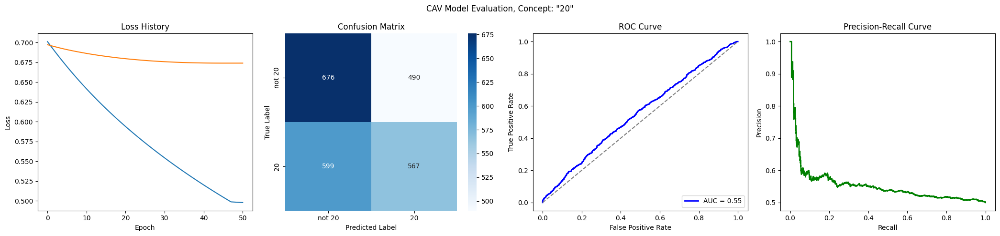

Training run 29/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6397
Epoch 11 Validation Loss: 0.6822
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5955
Epoch 21 Validation Loss: 0.6777
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5605
Epoch 31 Validation Loss: 0.6772
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_20/loss_history.json


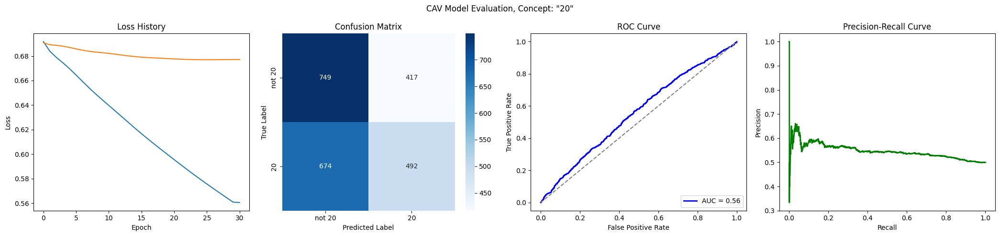

Training run 30/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6964
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6503
Epoch 11 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/singer_age_decade_20/loss_history.json


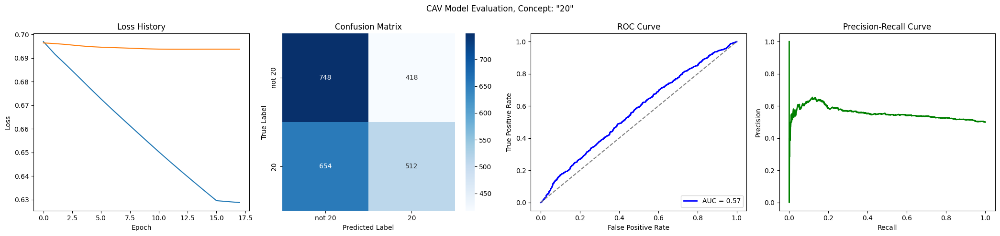

Training run 31/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6959
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


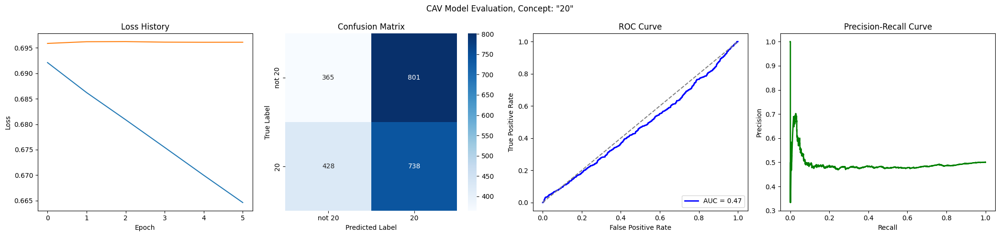

Training run 32/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6474
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_20/loss_history.json


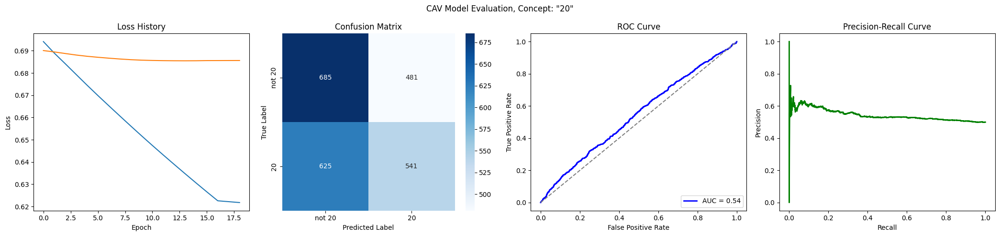

Training run 33/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7019
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6609
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6304
Epoch 21 Validation Loss: 0.6766
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6037
Epoch 31 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5799
Epoch 41 Validation Loss: 0.6708
Epoch 51/500
Epoch 51 Train Loss: 0.5716
Epoch 51 Validation Loss: 0.6706
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5694
Epoch 61 Validation Loss: 0.6702
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5671
Epoch 71 Validation Loss: 0.6700
Model saved to tr

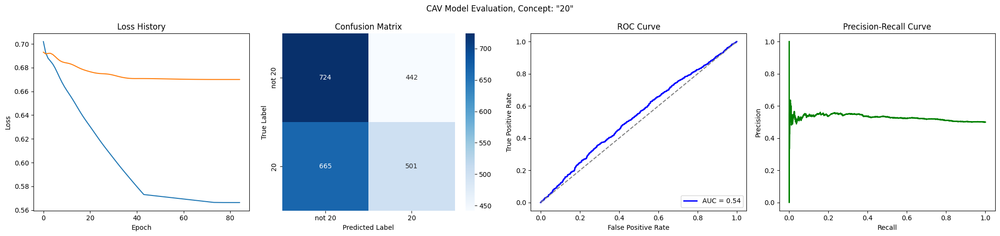

Training run 34/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7029
Epoch 1 Validation Loss: 0.7009
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6550
Epoch 11 Validation Loss: 0.6984
Early stopping at epoch 13
Loss history saved to trainings/singer_age_decade_20/loss_history.json


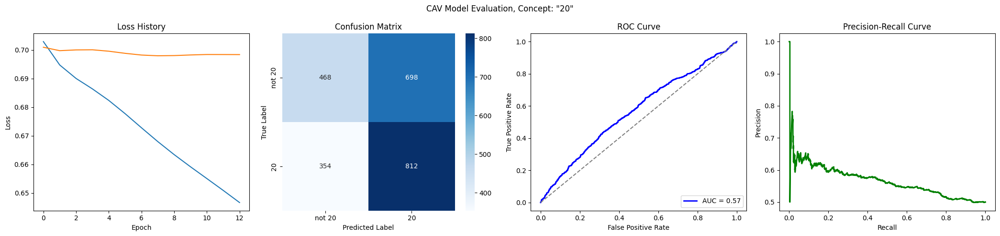

Training run 35/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 9
Loss history saved to trainings/singer_age_decade_20/loss_history.json


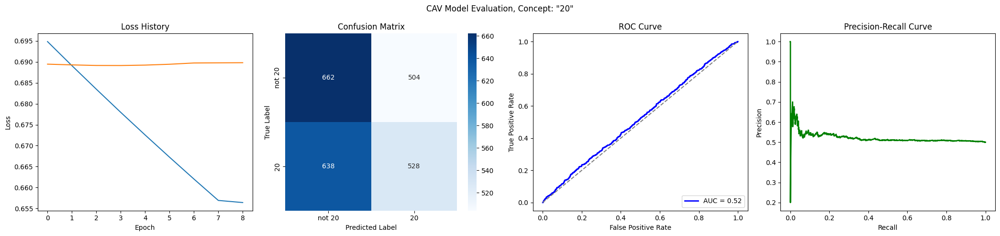

Training run 36/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6504
Epoch 11 Validation Loss: 0.6913
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_20/loss_history.json


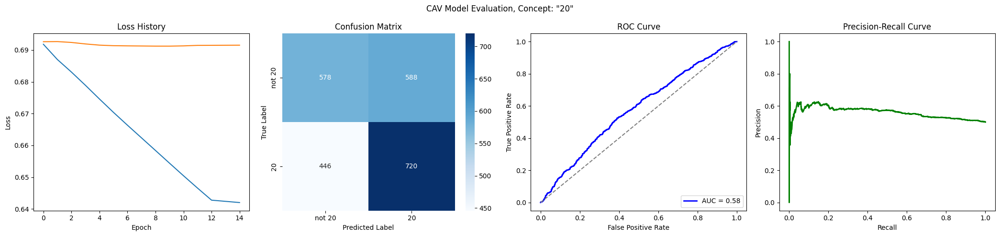

Training run 37/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6351
Epoch 11 Validation Loss: 0.6841
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5841
Epoch 21 Validation Loss: 0.6819
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_20/loss_history.json


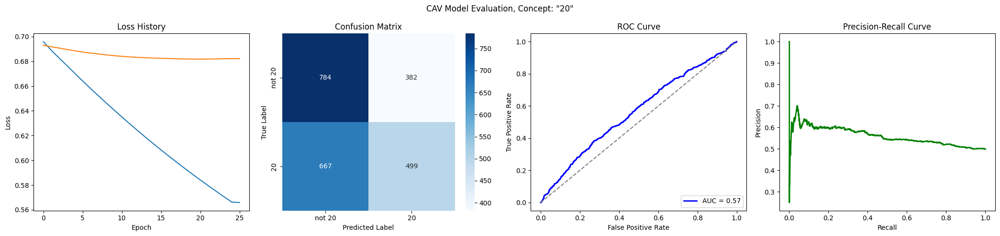

Training run 38/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6811
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6105
Epoch 21 Validation Loss: 0.6744
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5754
Epoch 31 Validation Loss: 0.6714
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5439
Epoch 41 Validation Loss: 0.6701
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5154
Epoch 51 Validation Loss: 0.6694
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4962
Epoch 61 Validation Loss: 0.6694
Early stopping at epoch 62
Loss history saved to trainings/singer_age_decade_20/loss_histor

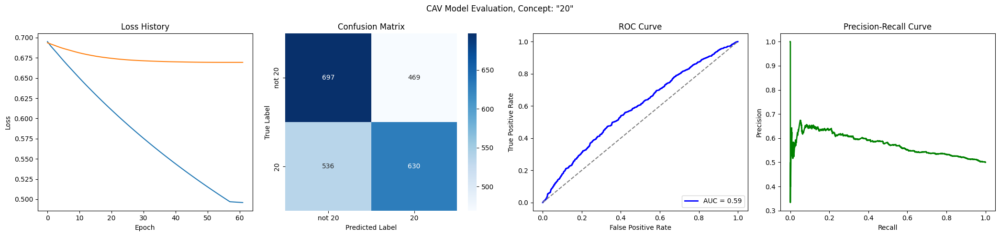

Training run 39/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6864
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


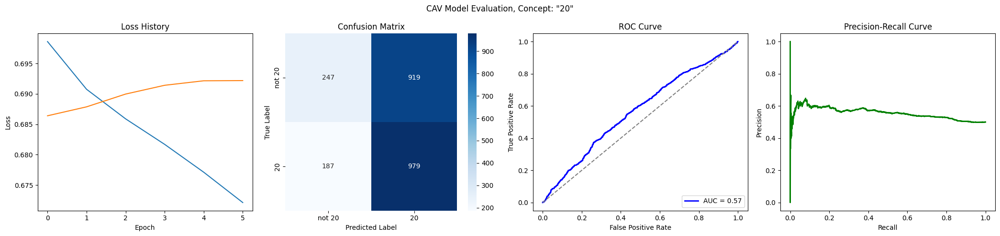

Training run 40/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6381
Epoch 11 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5925
Epoch 21 Validation Loss: 0.6877
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5542
Epoch 31 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5211
Epoch 41 Validation Loss: 0.6845
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4946
Epoch 51 Validation Loss: 0.6843
Early stopping at epoch 53
Loss history saved to trainings/singer_age_decade_20/loss_history.json


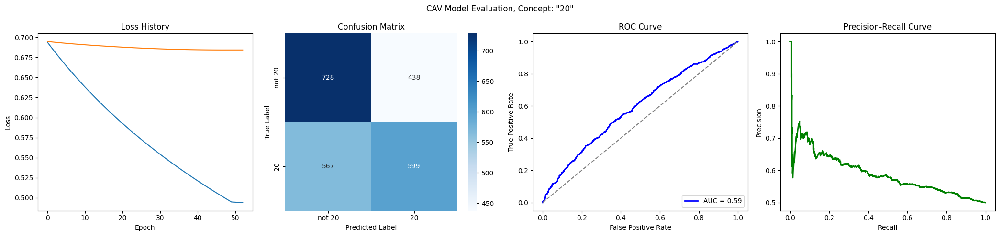

Training run 41/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6474
Epoch 11 Validation Loss: 0.6915
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_20/loss_history.json


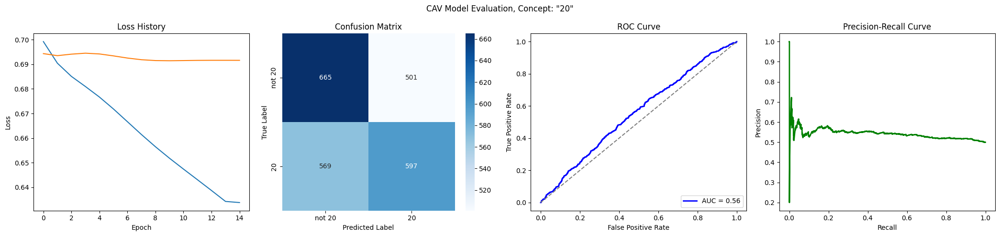

Training run 42/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6275
Epoch 11 Validation Loss: 0.6711
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5781
Epoch 21 Validation Loss: 0.6639
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5391
Epoch 31 Validation Loss: 0.6625
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 36
Loss history saved to trainings/singer_age_decade_20/loss_history.json


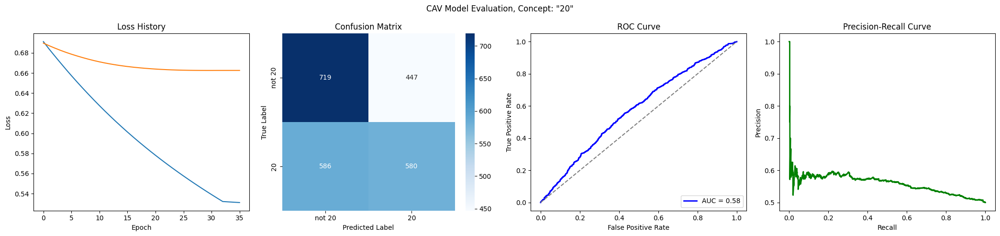

Training run 43/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6419
Epoch 11 Validation Loss: 0.6917
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_20/loss_history.json


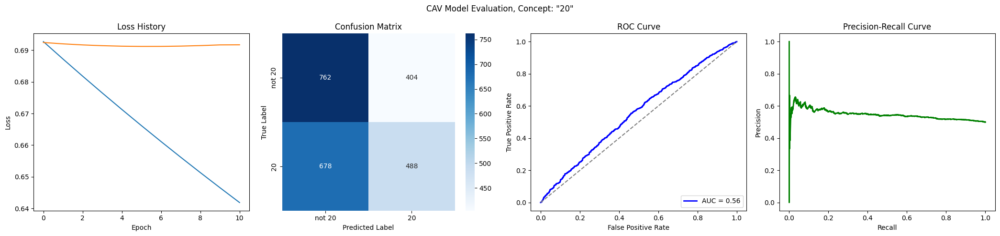

Training run 44/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6325
Epoch 11 Validation Loss: 0.6716
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5810
Epoch 21 Validation Loss: 0.6625
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5382
Epoch 31 Validation Loss: 0.6587
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5018
Epoch 41 Validation Loss: 0.6576
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 48
Loss history saved to trainings/singer_age_decade_20/loss_history.json


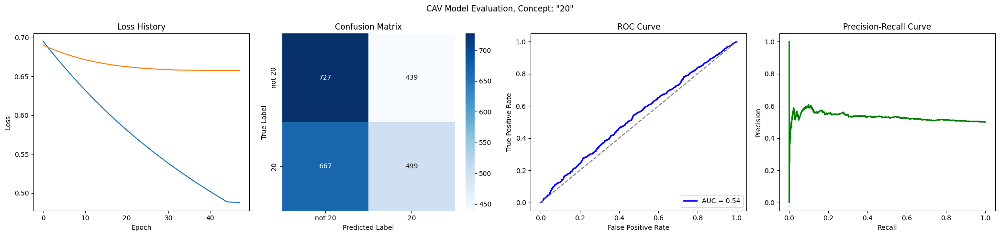

Training run 45/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6968
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6479
Epoch 11 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6062
Epoch 21 Validation Loss: 0.6889
Early stopping at epoch 25
Loss history saved to trainings/singer_age_decade_20/loss_history.json


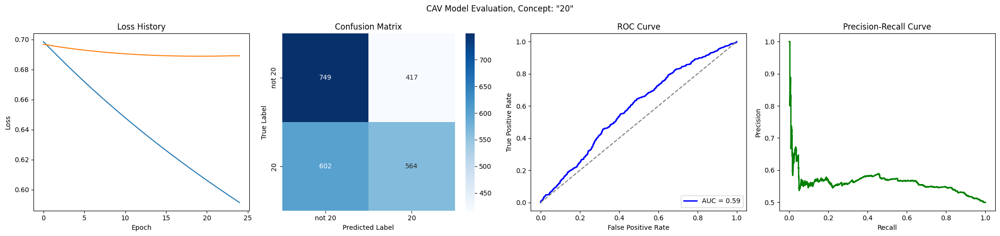

Training run 46/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6878
Epoch 1 Validation Loss: 0.6907
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6299
Epoch 11 Validation Loss: 0.6821
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5828
Epoch 21 Validation Loss: 0.6780
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5433
Epoch 31 Validation Loss: 0.6767
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 38
Loss history saved to trainings/singer_age_decade_20/loss_history.json


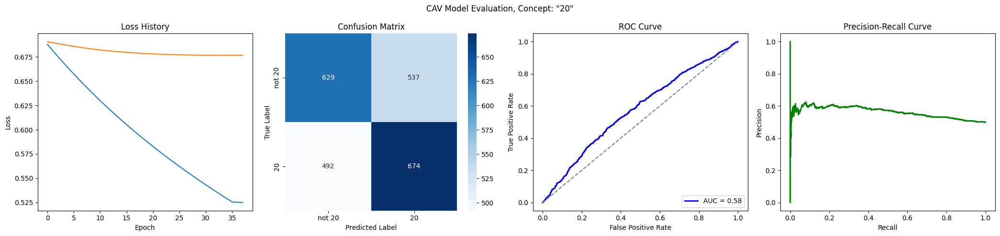

Training run 47/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6992
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6489
Epoch 11 Validation Loss: 0.6974
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_20/loss_history.json


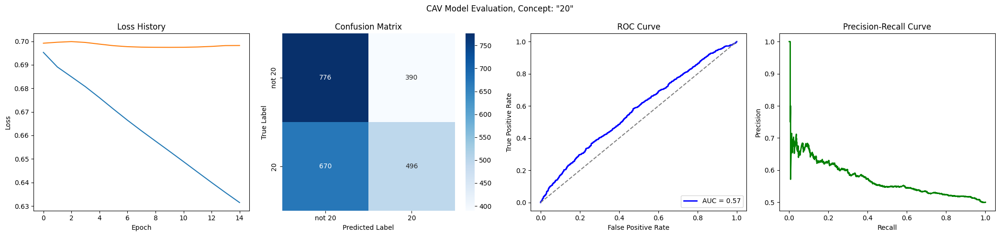

Training run 48/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6899
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6259
Epoch 11 Validation Loss: 0.6789
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5756
Epoch 21 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5350
Epoch 31 Validation Loss: 0.6717
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5039
Epoch 41 Validation Loss: 0.6715
Early stopping at epoch 41
Loss history saved to trainings/singer_age_decade_20/loss_history.json


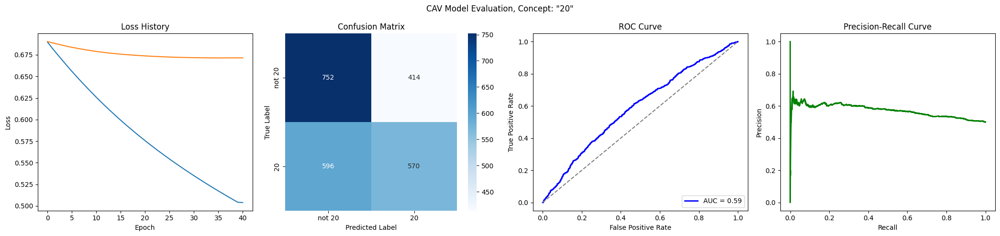

Training run 49/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6957
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


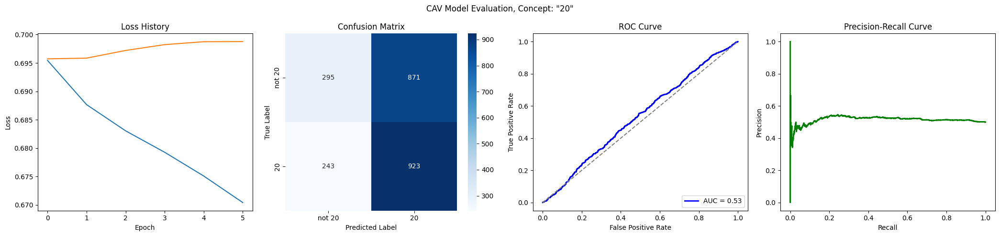

Training run 50/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7003
Epoch 1 Validation Loss: 0.6882
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6590
Epoch 11 Validation Loss: 0.6741
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6246
Epoch 21 Validation Loss: 0.6640
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5940
Epoch 31 Validation Loss: 0.6588
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5667
Epoch 41 Validation Loss: 0.6575
Early stopping at epoch 44
Loss history saved to trainings/singer_age_decade_20/loss_history.json


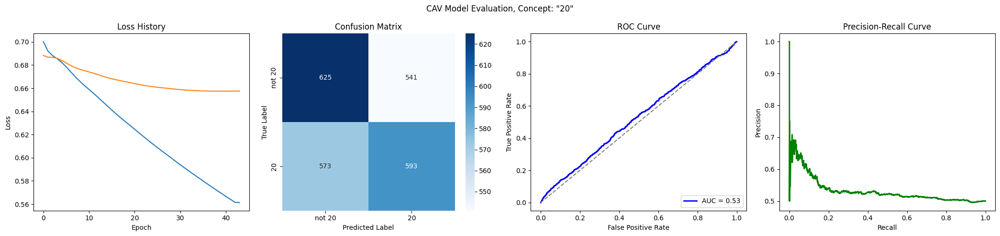

Training run 51/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6915
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


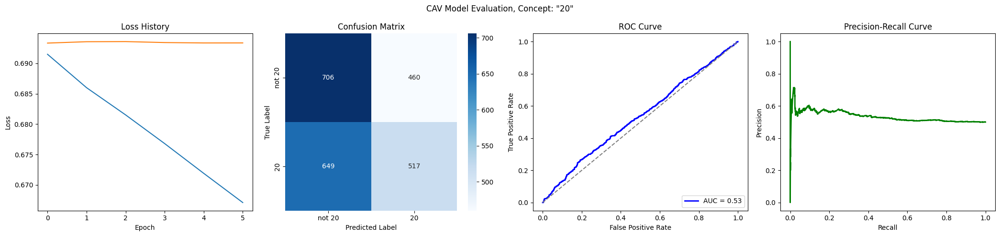

Training run 52/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6486
Epoch 11 Validation Loss: 0.6787
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6076
Epoch 21 Validation Loss: 0.6718
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5721
Epoch 31 Validation Loss: 0.6683
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5409
Epoch 41 Validation Loss: 0.6664
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5130
Epoch 51 Validation Loss: 0.6658
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 57
Loss history saved to trainings/singer_age_decade_20/loss_history.json


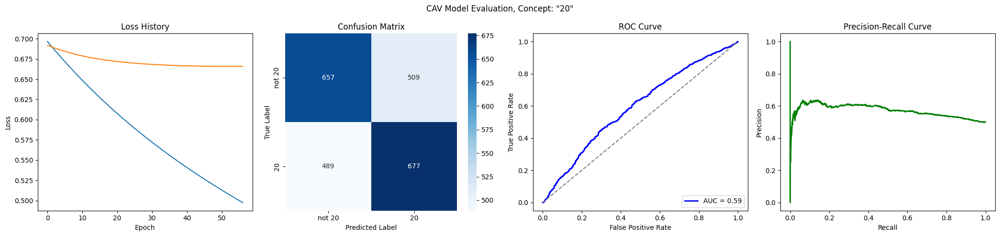

Training run 53/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6524
Epoch 11 Validation Loss: 0.6842
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6138
Epoch 21 Validation Loss: 0.6817
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_20/loss_history.json


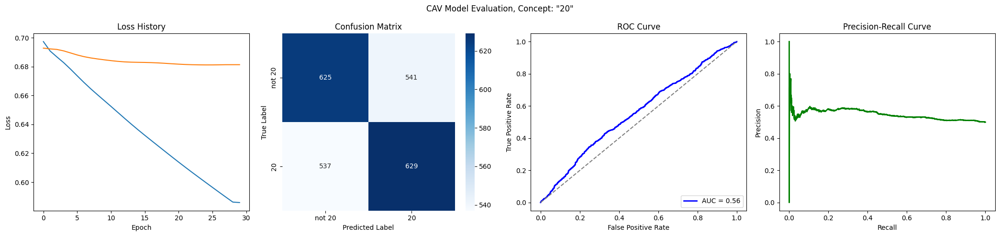

Training run 54/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6909
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6413
Epoch 11 Validation Loss: 0.6850
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5978
Epoch 21 Validation Loss: 0.6801
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5597
Epoch 31 Validation Loss: 0.6761
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5261
Epoch 41 Validation Loss: 0.6733
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4961
Epoch 51 Validation Loss: 0.6716
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4690
Epoch 61 Validation Loss: 0.6709
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 68
Los

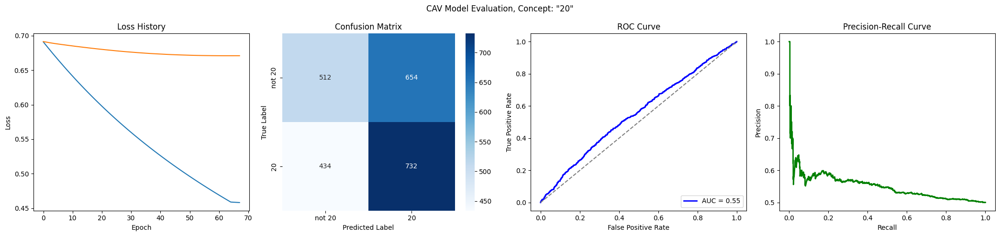

Training run 55/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


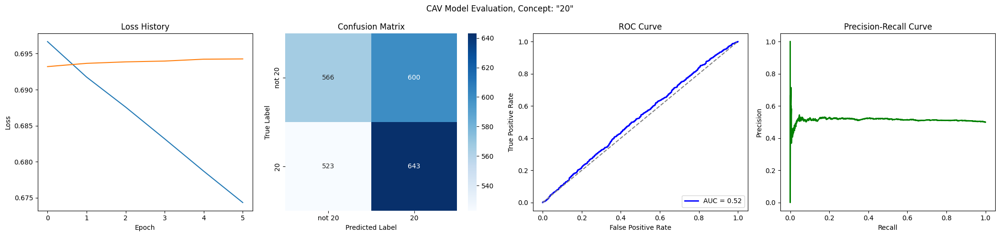

Training run 56/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


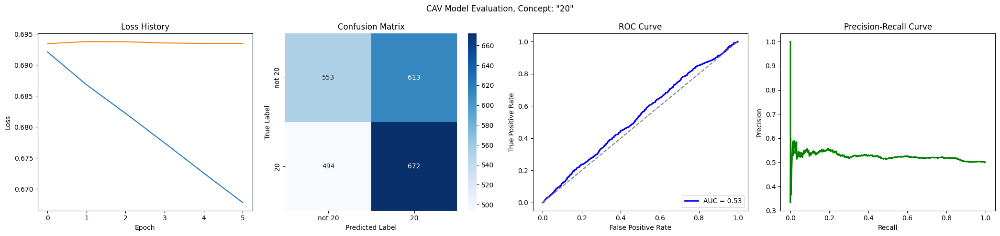

Training run 57/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6545
Epoch 11 Validation Loss: 0.6934
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_20/loss_history.json


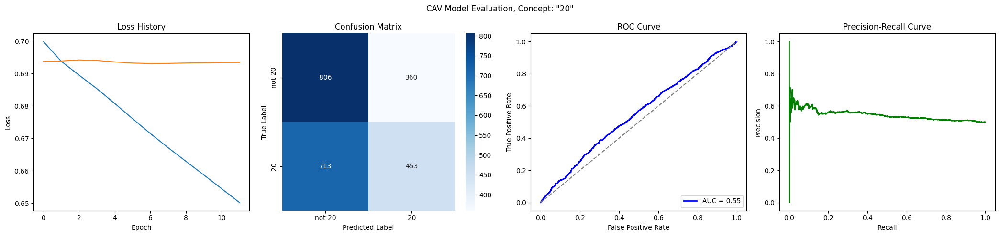

Training run 58/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6960
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6354
Epoch 11 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_20/loss_history.json


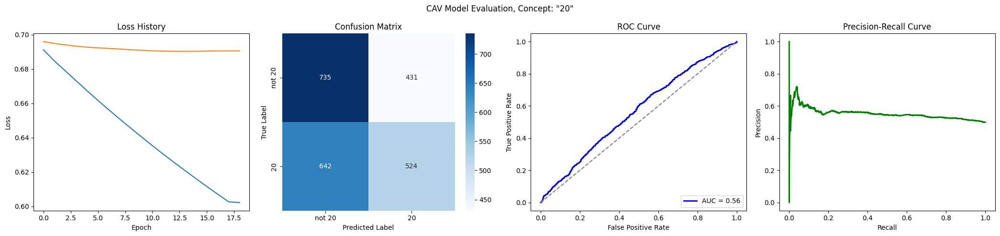

Training run 59/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6601
Epoch 11 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_20/loss_history.json


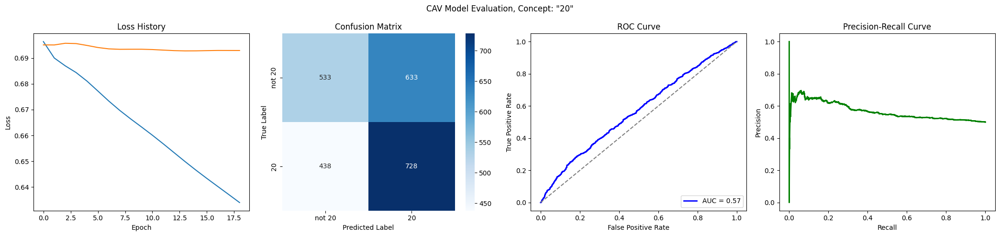

Training run 60/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


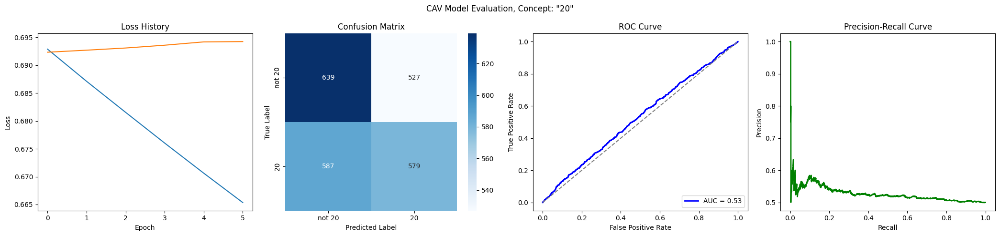

Training run 61/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6428
Epoch 11 Validation Loss: 0.6772
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6042
Epoch 21 Validation Loss: 0.6712
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5722
Epoch 31 Validation Loss: 0.6694
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 37
Loss history saved to trainings/singer_age_decade_20/loss_history.json


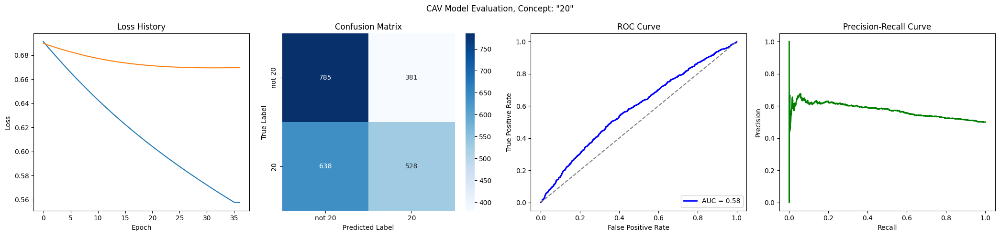

Training run 62/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


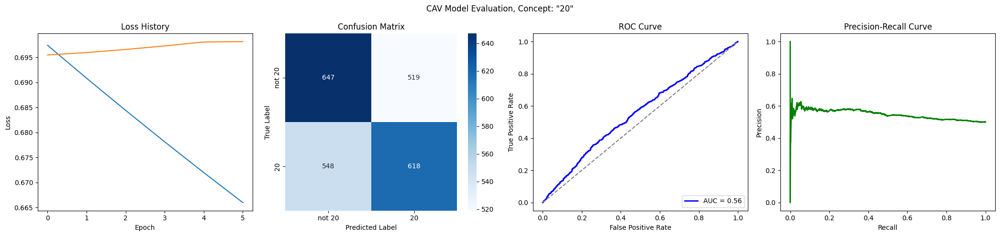

Training run 63/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


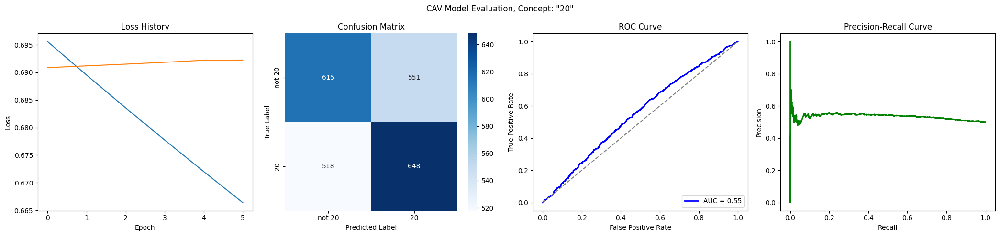

Training run 64/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6395
Epoch 11 Validation Loss: 0.6843
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_20/loss_history.json


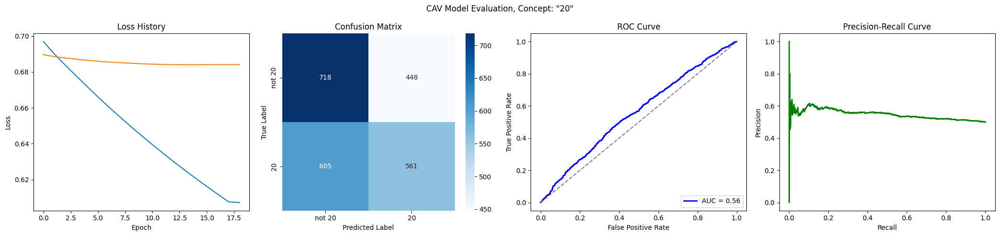

Training run 65/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6989
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


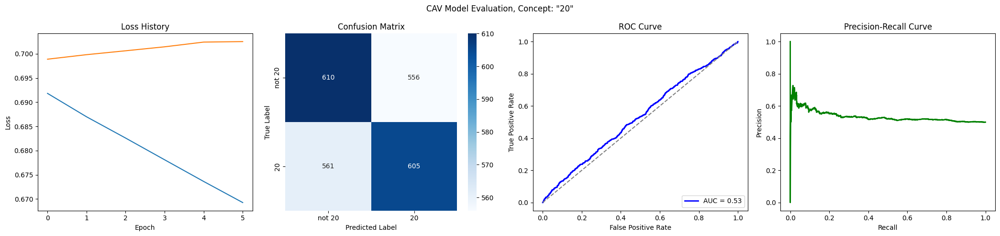

Training run 66/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6950
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6383
Epoch 11 Validation Loss: 0.6872
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5931
Epoch 21 Validation Loss: 0.6858
Early stopping at epoch 24
Loss history saved to trainings/singer_age_decade_20/loss_history.json


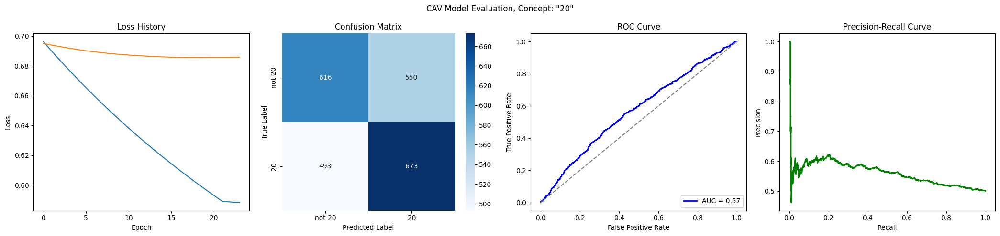

Training run 67/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6540
Epoch 11 Validation Loss: 0.6896
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_20/loss_history.json


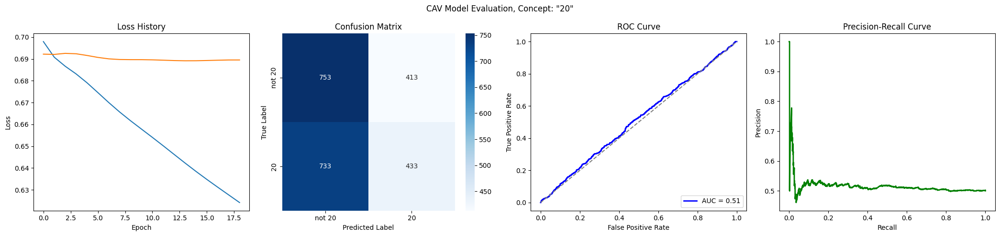

Training run 68/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6472
Epoch 11 Validation Loss: 0.6943
Early stopping at epoch 11
Loss history saved to trainings/singer_age_decade_20/loss_history.json


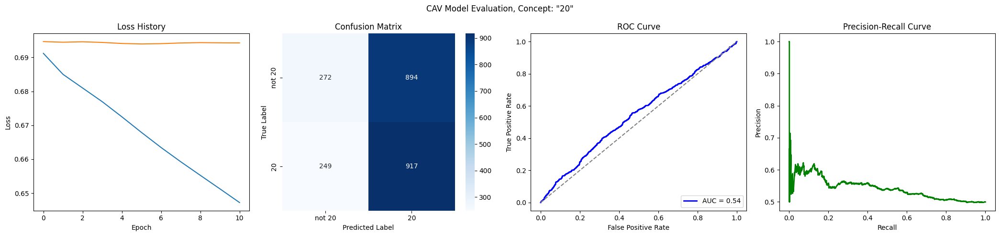

Training run 69/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


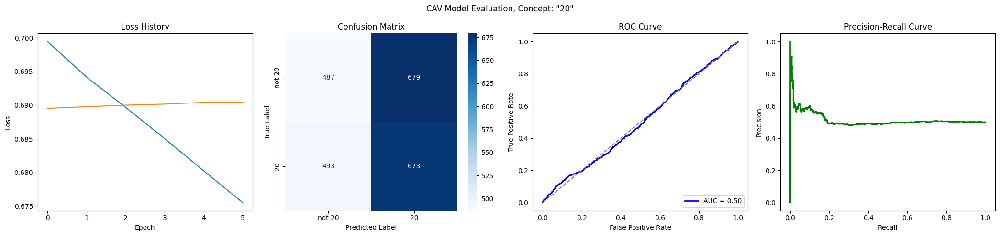

Training run 70/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6417
Epoch 11 Validation Loss: 0.6885
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/singer_age_decade_20/loss_history.json


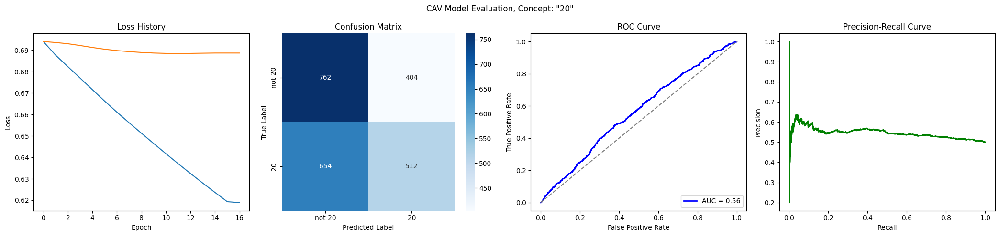

Training run 71/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6376
Epoch 11 Validation Loss: 0.6695
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5913
Epoch 21 Validation Loss: 0.6569
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5521
Epoch 31 Validation Loss: 0.6504
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5185
Epoch 41 Validation Loss: 0.6481
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/singer_age_decade_20/loss_history.json


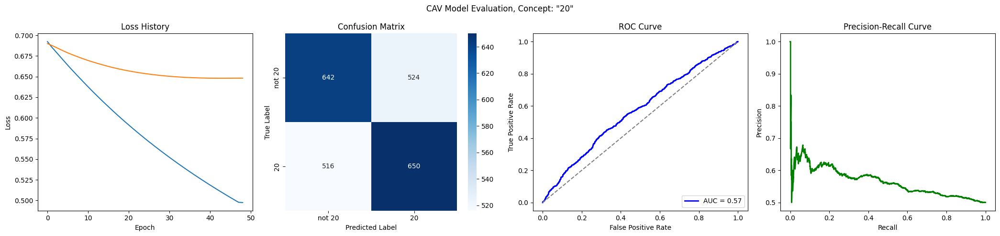

Training run 72/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6457
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6059
Epoch 21 Validation Loss: 0.6747
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5786
Epoch 31 Validation Loss: 0.6742
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_20/loss_history.json


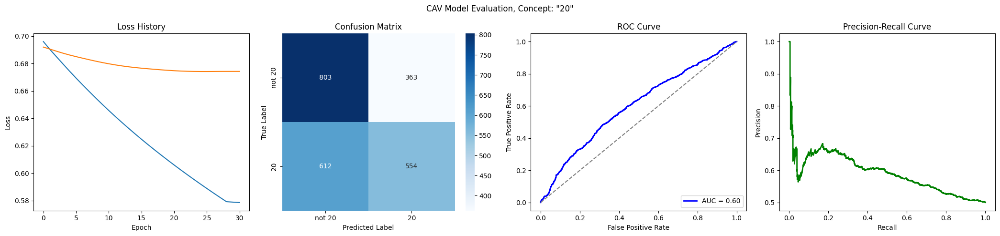

Training run 73/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


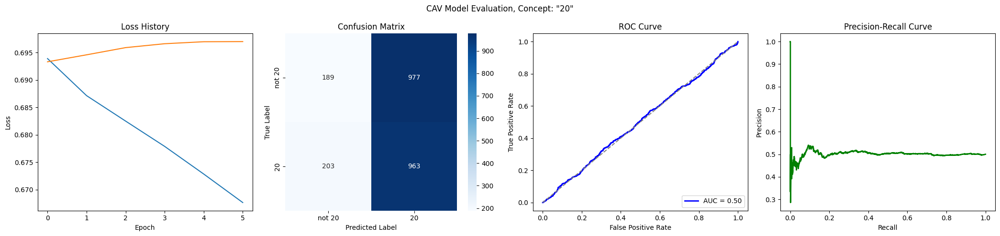

Training run 74/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6973
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6511
Epoch 11 Validation Loss: 0.6822
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6105
Epoch 21 Validation Loss: 0.6771
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5750
Epoch 31 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5437
Epoch 41 Validation Loss: 0.6745
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 48
Loss history saved to trainings/singer_age_decade_20/loss_history.json


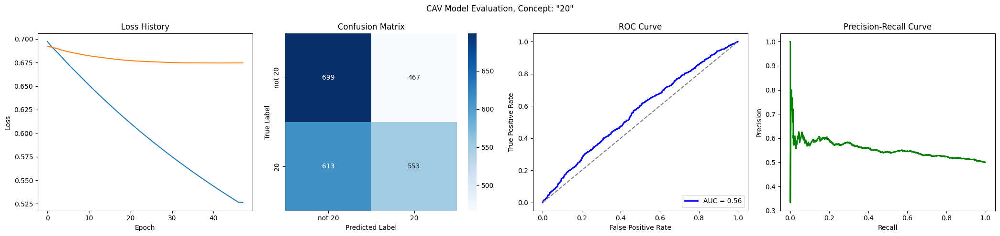

Training run 75/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6893
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6501
Epoch 11 Validation Loss: 0.6884
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_20/loss_history.json


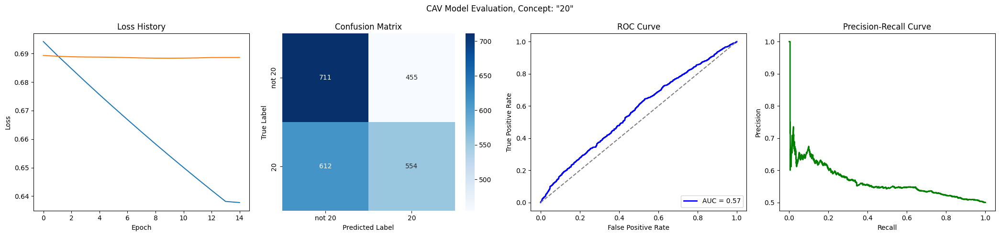

Training run 76/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6967
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_20/loss_history.json


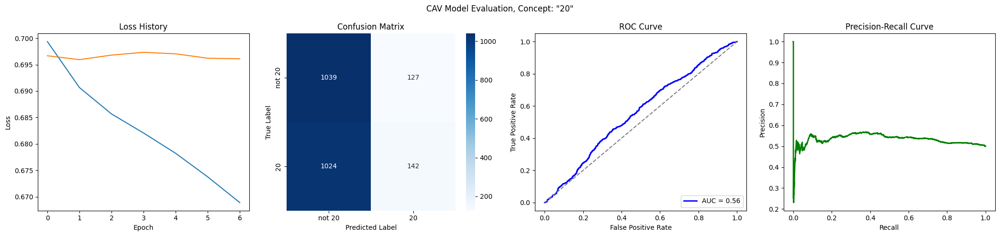

Training run 77/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6982
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_20/loss_history.json


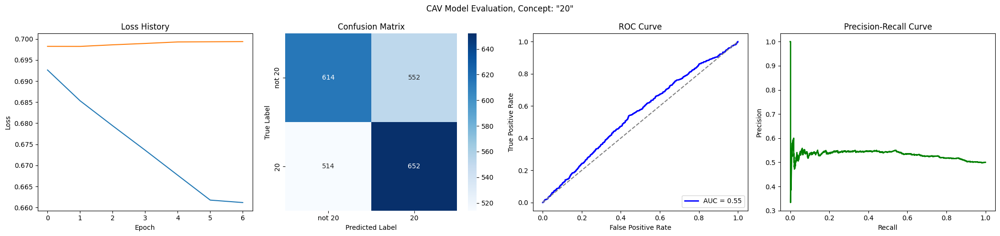

Training run 78/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6991
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6493
Epoch 11 Validation Loss: 0.6722
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6079
Epoch 21 Validation Loss: 0.6636
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5720
Epoch 31 Validation Loss: 0.6607
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5429
Epoch 41 Validation Loss: 0.6605
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_20/loss_history.json


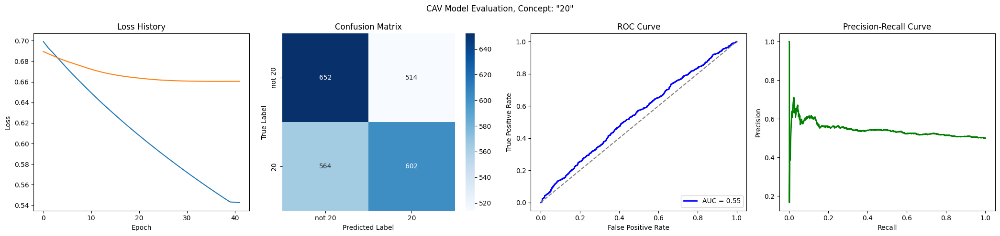

Training run 79/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7086
Epoch 1 Validation Loss: 0.6986
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6603
Epoch 11 Validation Loss: 0.6840
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6216
Epoch 21 Validation Loss: 0.6751
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5876
Epoch 31 Validation Loss: 0.6690
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5575
Epoch 41 Validation Loss: 0.6655
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5305
Epoch 51 Validation Loss: 0.6632
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5058
Epoch 61 Validation Loss: 0.6610
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

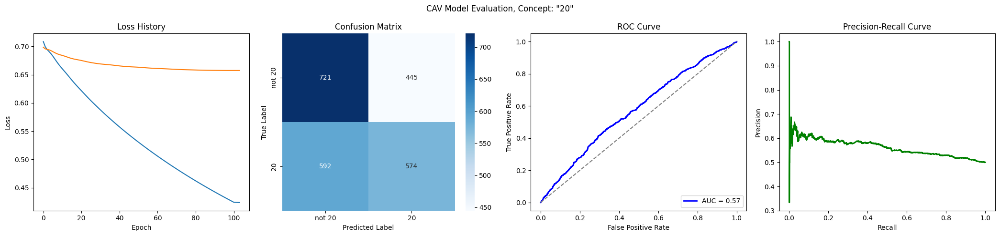

Training run 80/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6539
Epoch 11 Validation Loss: 0.6826
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6186
Epoch 21 Validation Loss: 0.6785
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_20/loss_history.json


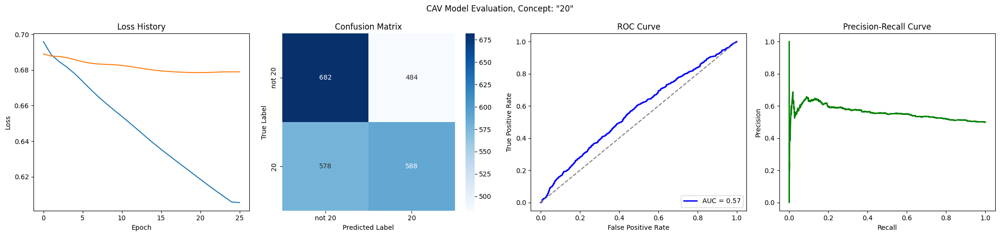

Training run 81/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7006
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6589
Epoch 11 Validation Loss: 0.6744
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6242
Epoch 21 Validation Loss: 0.6649
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5940
Epoch 31 Validation Loss: 0.6593
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5672
Epoch 41 Validation Loss: 0.6561
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5429
Epoch 51 Validation Loss: 0.6549
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5226
Epoch 61 Validation Loss: 0.6546
Early stopping at epoch 62
Loss history saved to trainings/singer_age_decade_20/loss_histor

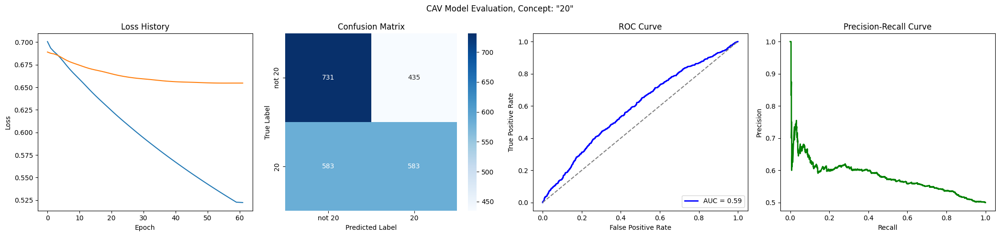

Training run 82/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6968
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6472
Epoch 11 Validation Loss: 0.6865
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6070
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5724
Epoch 31 Validation Loss: 0.6768
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5420
Epoch 41 Validation Loss: 0.6749
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5148
Epoch 51 Validation Loss: 0.6742
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4945
Epoch 61 Validation Loss: 0.6741
Early stopping at epoch 61
Loss history saved to trainings/singer_age_decade_20/loss_histor

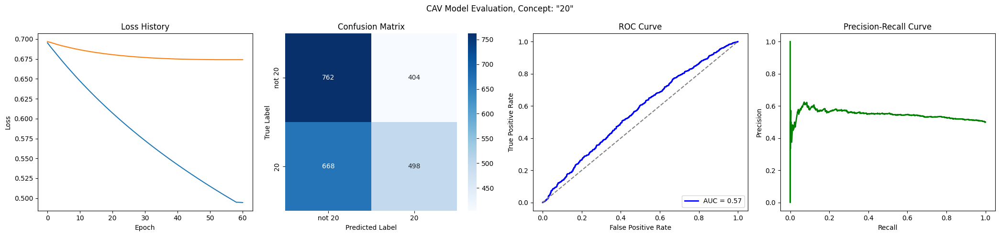

Training run 83/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6900
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6392
Epoch 11 Validation Loss: 0.6869
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5981
Epoch 21 Validation Loss: 0.6854
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_20/loss_history.json


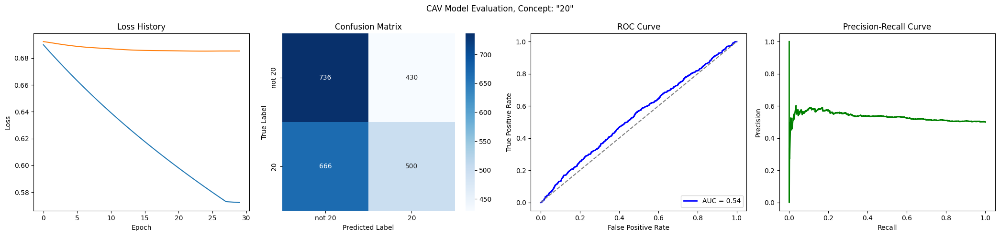

Training run 84/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7027
Epoch 1 Validation Loss: 0.6961
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6619
Epoch 11 Validation Loss: 0.6792
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6268
Epoch 21 Validation Loss: 0.6659
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5946
Epoch 31 Validation Loss: 0.6557
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5651
Epoch 41 Validation Loss: 0.6481
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5379
Epoch 51 Validation Loss: 0.6425
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5125
Epoch 61 Validation Loss: 0.6381
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

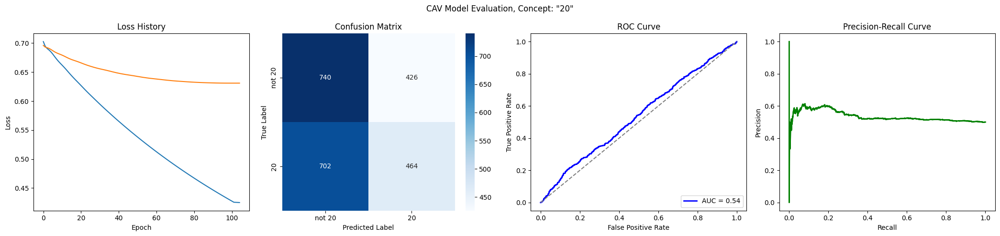

Training run 85/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6790
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6105
Epoch 21 Validation Loss: 0.6700
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5766
Epoch 31 Validation Loss: 0.6665
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 40
Loss history saved to trainings/singer_age_decade_20/loss_history.json


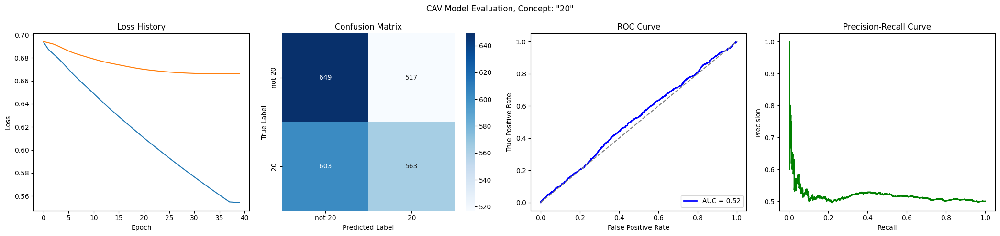

Training run 86/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6436
Epoch 11 Validation Loss: 0.6771
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5987
Epoch 21 Validation Loss: 0.6727
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5669
Epoch 31 Validation Loss: 0.6724
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_20/loss_history.json


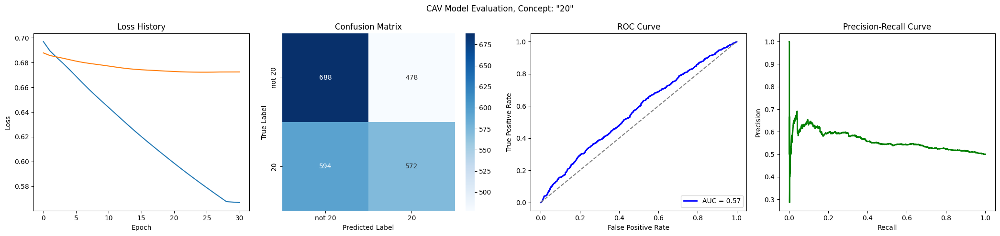

Training run 87/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6520
Epoch 11 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_20/loss_history.json


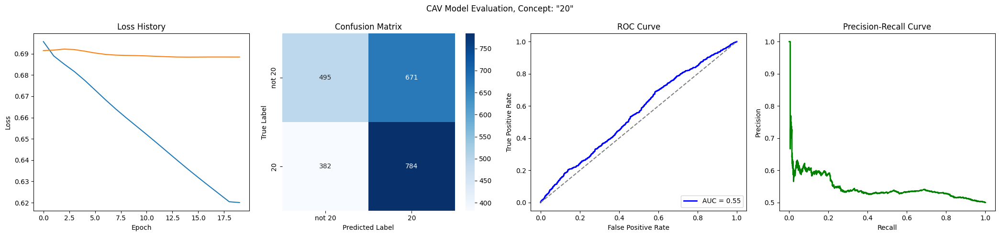

Training run 88/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6956
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6481
Epoch 11 Validation Loss: 0.6899
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6087
Epoch 21 Validation Loss: 0.6863
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5745
Epoch 31 Validation Loss: 0.6841
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5442
Epoch 41 Validation Loss: 0.6830
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_20/loss_history.json


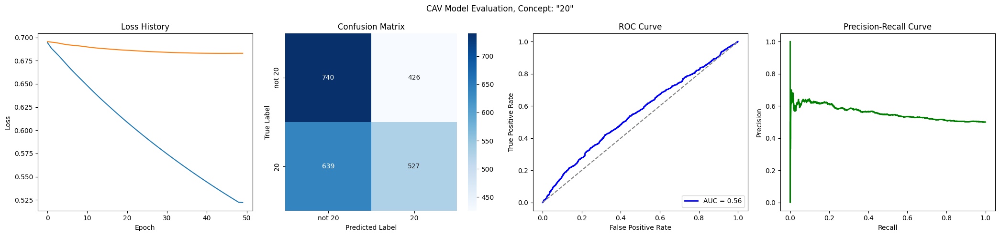

Training run 89/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6873
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6427
Epoch 11 Validation Loss: 0.6761
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6003
Epoch 21 Validation Loss: 0.6695
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5634
Epoch 31 Validation Loss: 0.6662
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5310
Epoch 41 Validation Loss: 0.6650
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_20/loss_history.json


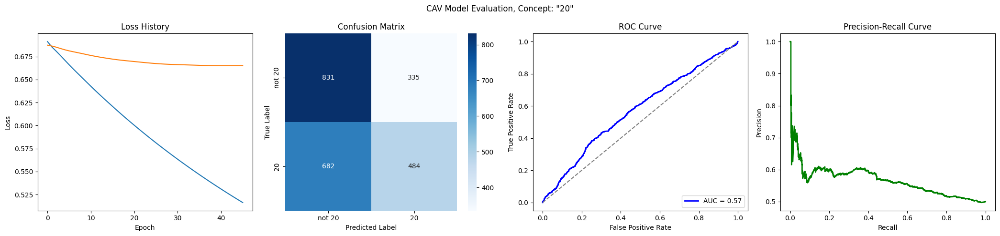

Training run 90/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6877
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6347
Epoch 11 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5913
Epoch 21 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5548
Epoch 31 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5234
Epoch 41 Validation Loss: 0.6732
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4958
Epoch 51 Validation Loss: 0.6730
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 56
Loss history saved to trainings/singer_age_decade_20/loss_history.json


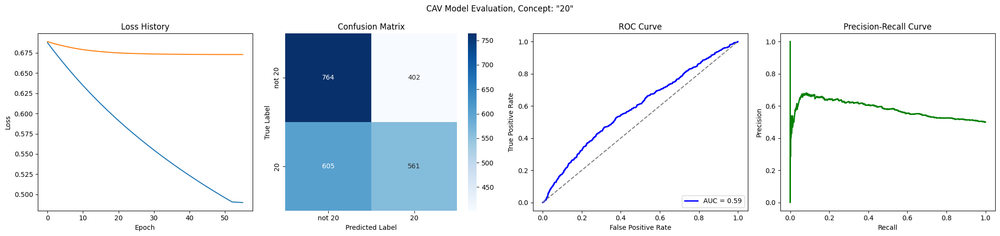

Training run 91/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6346
Epoch 11 Validation Loss: 0.6686
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5854
Epoch 21 Validation Loss: 0.6544
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5432
Epoch 31 Validation Loss: 0.6445
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5064
Epoch 41 Validation Loss: 0.6373
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4740
Epoch 51 Validation Loss: 0.6325
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4452
Epoch 61 Validation Loss: 0.6298
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

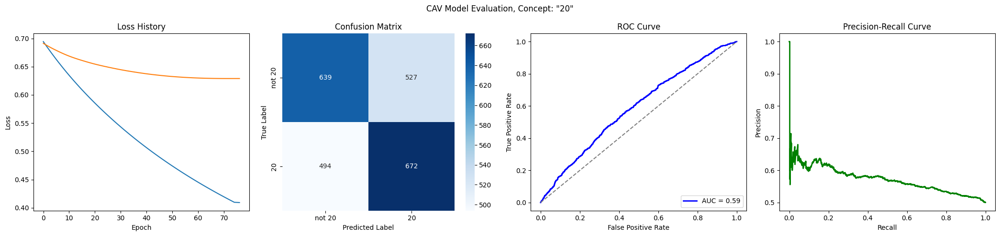

Training run 92/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6437
Epoch 11 Validation Loss: 0.6918
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_20/loss_history.json


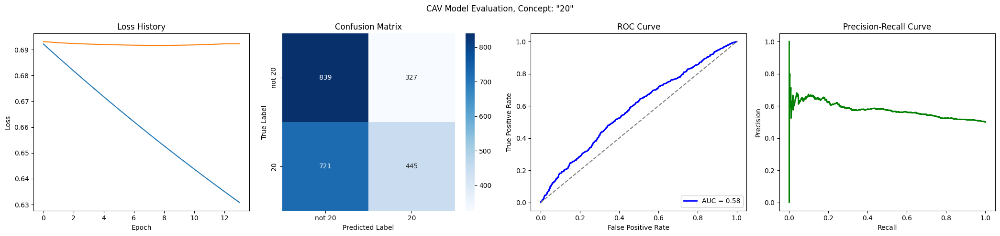

Training run 93/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6919
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6369
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5922
Epoch 21 Validation Loss: 0.6741
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5545
Epoch 31 Validation Loss: 0.6730
Early stopping at epoch 32
Loss history saved to trainings/singer_age_decade_20/loss_history.json


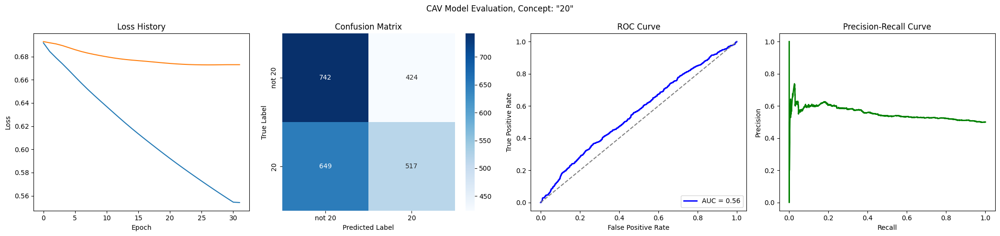

Training run 94/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6891
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6366
Epoch 11 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5917
Epoch 21 Validation Loss: 0.6757
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_20/loss_history.json


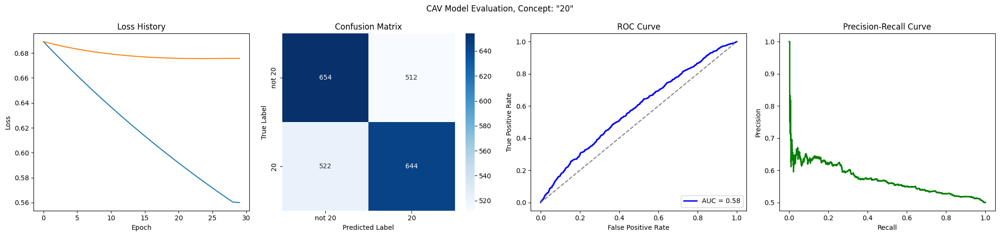

Training run 95/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7026
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_20/loss_history.json


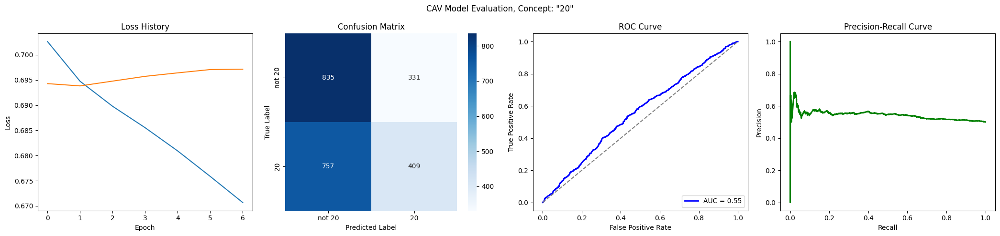

Training run 96/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6405
Epoch 11 Validation Loss: 0.6846
Early stopping at epoch 13
Loss history saved to trainings/singer_age_decade_20/loss_history.json


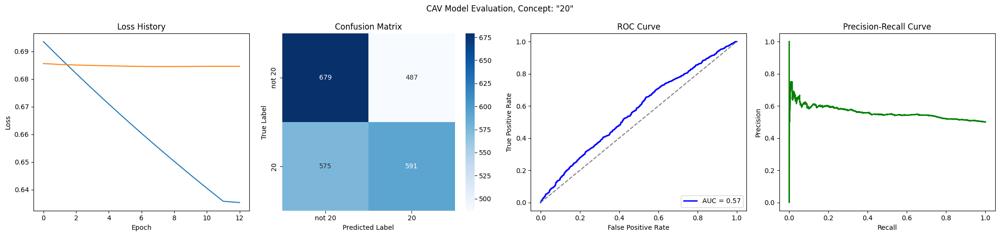

Training run 97/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6993
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


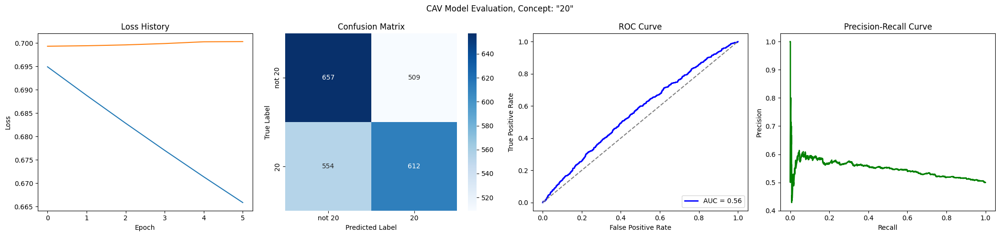

Training run 98/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_20/loss_history.json


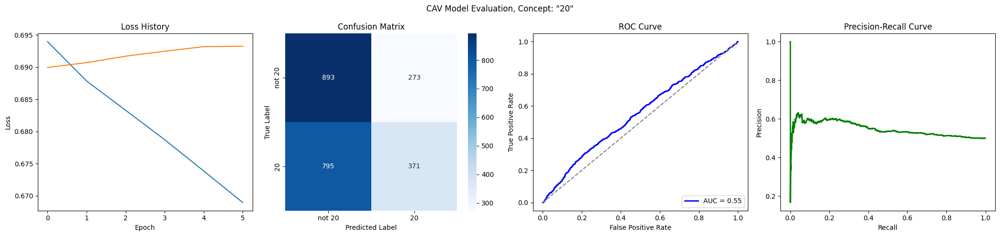

Training run 99/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6472
Epoch 11 Validation Loss: 0.6871
Model saved to trainings/singer_age_decade_20/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/singer_age_decade_20/loss_history.json


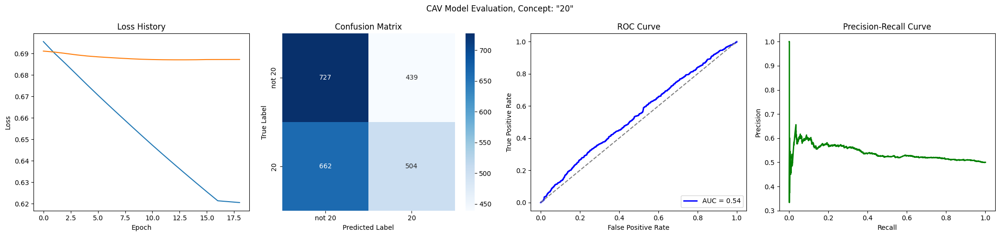

Training run 100/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6991
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6485
Epoch 11 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6058
Epoch 21 Validation Loss: 0.6761
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5695
Epoch 31 Validation Loss: 0.6754
Early stopping at epoch 34
Loss history saved to trainings/singer_age_decade_20/loss_history.json


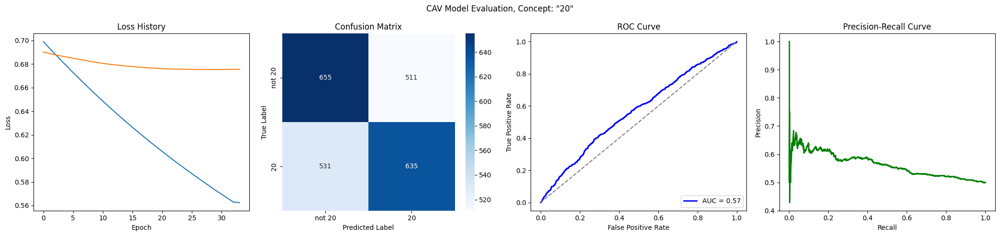

CPU times: user 6min 14s, sys: 2min 58s, total: 9min 12s
Wall time: 29min 10s


In [7]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [8]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [9]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [10]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [11]:
validation_sample_count

740

In [12]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


6652 740
Epoch 1/500
Epoch 1 Train Loss: 0.6821
Epoch 1 Validation Loss: 0.6708
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6328
Epoch 11 Validation Loss: 0.6309
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6225
Epoch 21 Validation Loss: 0.6238
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6164
Epoch 31 Validation Loss: 0.6214
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6120
Epoch 41 Validation Loss: 0.6204
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.6085
Epoch 51 Validation Loss: 0.6200
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.6040
Epoch 61 Validation Loss: 0.6190
Model saved to trainings/singer_age_decade_20/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.6036
Epoch 71

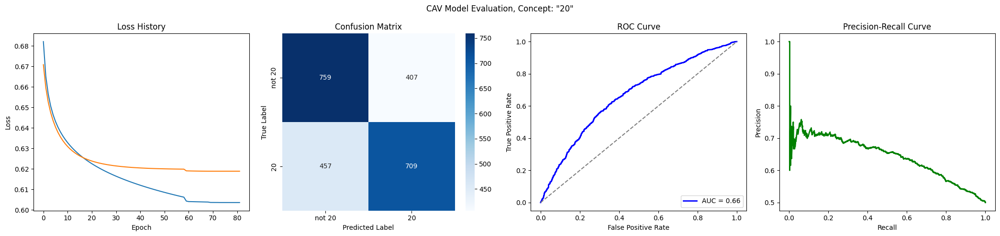

In [13]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
